##Importing the required libraries


In [ ]:
import pandas as pd
import re
import nltk
nltk.download('stopwords')
from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS
import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy

# Plotting tools
#import pyLDAvis
#import pyLDAvis.gensim  # don't skip this
!pip install pyLDAvis

import pyLDAvis
import pyLDAvis.gensim_models

pyLDAvis.enable_notebook()
#vis = pyLDAvis.gensim_models.prepare(ldamodel, doc_term_matrix, dictionary)

import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)
import nltk
nltk.download('all')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_lda.py:29: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  EPS = np.finfo(np.float).eps


[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package biocreative_ppi is already up-to-date!
[nltk_data]    | Downloading package brown to /root/nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package brown_tei to /root/nltk_data...
[nltk_data]    |   Package brown_tei is already up-to-date!
[nltk_data]    | Downloading package cess_cat to /root/nltk_data...
[nltk_data]    |   Package cess_cat is already up-to-date!
[nltk_data]    | Downloading package cess_esp to /root/nltk_data...
[nltk_data]    |   Package cess_esp is already up-to-date!
[nltk_data]    | Downloading packag

True

##Uploading the .csv files

In [ ]:
filenames_list = []
for i in range(14):
  if i<9:
    name = f"/content/Jan0{i+1}.csv"
  else:
    name = f"/content/Jan{i+1}.csv"
  filenames_list.append(name)
print(filenames_list)

['/content/Jan01.csv', '/content/Jan02.csv', '/content/Jan03.csv', '/content/Jan04.csv', '/content/Jan05.csv', '/content/Jan06.csv', '/content/Jan07.csv', '/content/Jan08.csv', '/content/Jan09.csv', '/content/Jan10.csv', '/content/Jan11.csv', '/content/Jan12.csv', '/content/Jan13.csv', '/content/Jan14.csv']


In [ ]:
data = []
for i in range(14):
  name = f"df{i+1}"
  df = pd.read_csv(filenames_list[i])
  data.append(df)


In [ ]:

df = pd.concat(data)
df

,Unnamed: 0,Clean Text
0,0,"['decisive glorious', 'land king', 'chala', 'c..."
1,1,"['born queen', 'take', 'south india', 'oak', '..."
2,2,"['indigo', 'server hacked', 'december', 'inter..."
3,3,"['sony', 'launch', 'playstation india', 'febru..."
4,4,"['apple', 'remove', 'game apps', 'china store'..."
...,...,...
204,204,"['enterprises', 'wins', 'crore', 'highway', 'p..."
205,205,"['petrol', 'diesel', 'prices', 'hiked', 'scale..."
206,206,"['rupee', 'gains', 'paise', 'finish', 'us_doll..."
207,207,"['rupee', 'slips', 'paise', 'us_dollar', 'earl..."


In [ ]:
df = df.rename({'Clean Text': 'Text'}, axis='columns')
df.drop(columns="Unnamed: 0", inplace=True)

##Extracting text from the data frame and appending to a list

In [ ]:
text_list = []
for i in range(len(df)):
  text_list.append(df['Text'].values[i])
text_list

["['decisive glorious', 'land king', 'chala', 'cape cod', 'work', 'decisive glorious', 'land king', 'chala', 'cape cod', 'worked', 'horse', 'exercised', 'friday', 'january', 'fashion', 'star', 'app', 'sovereign', 'power', 'app', 'easy', 'romantic', 'bay', 'baskar', 'empress', 'andromeda', 'sky', 'app', 'finished', 'tifosi', 'maintains', 'form', 'silverman', 'ayaz', 'khan', 'hadar', 'alam', 'moved', 'better', 'finished', 'merrywin', 'cape cod', 'murugan', 'impressed', 'naomi', 'azad', 'alam', 'green', 'channel', 'app', 'kingoftheworld', 'murugan', 'fully', 'eased', 'glorious land', 'alam', 'fine', 'nick', 'king chala', 'azfar syeed', 'moved', 'amendment', 'annexed', 'iltaf', 'hussain', 'moved', 'freely', 'knight', 'envied', 'emelda', 'good', 'shape', 'decisive', 'shahar', 'babu', 'pleased', 'wild', 'passion', 'app', 'optimus', 'commander', 'janardhan', 'maidstone', 'kamigallu', 'supreme', 'excelsior', 'battista', 'rajendra', 'singh', 'moved', 'bit', 'exquisite', 'star', 'prince', 'winds

In [ ]:
flat_list = []
flat_list1 = []
for i in text_list:
  for j in i:
    flat_list1.append(j)
flat_list = "".join(flat_list1)
flat_list

"['decisive glorious', 'land king', 'chala', 'cape cod', 'work', 'decisive glorious', 'land king', 'chala', 'cape cod', 'worked', 'horse', 'exercised', 'friday', 'january', 'fashion', 'star', 'app', 'sovereign', 'power', 'app', 'easy', 'romantic', 'bay', 'baskar', 'empress', 'andromeda', 'sky', 'app', 'finished', 'tifosi', 'maintains', 'form', 'silverman', 'ayaz', 'khan', 'hadar', 'alam', 'moved', 'better', 'finished', 'merrywin', 'cape cod', 'murugan', 'impressed', 'naomi', 'azad', 'alam', 'green', 'channel', 'app', 'kingoftheworld', 'murugan', 'fully', 'eased', 'glorious land', 'alam', 'fine', 'nick', 'king chala', 'azfar syeed', 'moved', 'amendment', 'annexed', 'iltaf', 'hussain', 'moved', 'freely', 'knight', 'envied', 'emelda', 'good', 'shape', 'decisive', 'shahar', 'babu', 'pleased', 'wild', 'passion', 'app', 'optimus', 'commander', 'janardhan', 'maidstone', 'kamigallu', 'supreme', 'excelsior', 'battista', 'rajendra', 'singh', 'moved', 'bit', 'exquisite', 'star', 'prince', 'windso

##Data Cleansing for the entire corpus of text

In [ ]:
for m in range(len(df)):
  
  #Removing all non-letters and non-digits
  df['Text'].values[m] = (re.sub(r"\W", " ", df['Text'].values[m]))
  

  #Removing all extra white spaces
  df['Text'].values[m] = " ".join(df['Text'].values[m].split())


In [ ]:
df['Text']

0      decisive glorious land king chala cape cod wor...
1      born queen take south india oak style rewardin...
2      indigo server hacked december internal documen...
3      sony launch playstation india february pre ord...
4      apple remove game apps china store meet deadli...
                             ...                        
204    enterprises wins crore highway project nhai ke...
205    petrol diesel prices hiked scale new highs mum...
206    rupee gains paise finish us_dollar interbank f...
207    rupee slips paise us_dollar early trade trader...
208    sensex drops points early trade nifty tests ac...
Name: Text, Length: 4778, dtype: object

In [ ]:
# Function to perform Tokenizing 
def tokenizing(Text):
  split = re.split('\W+', Text)
  return split

In [ ]:
df['Text']=df['Text'].apply(lambda x: tokenizing(x.lower()))

In [ ]:
text_list = []
for j in range(len(df)):
  for i in df['Text'].values[j]:
    text_list.append(i)
len(text_list)

861700

##Frequency distribution Graph for the most frequently occuring words 

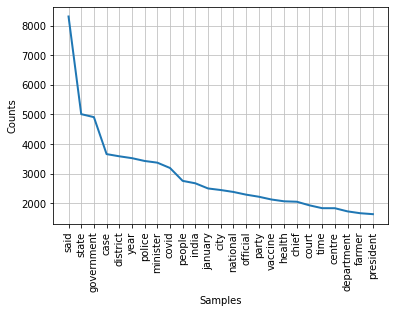

In [ ]:
import nltk
#from nltk.corpus import webtext
from nltk.probability import FreqDist


data_analysis = nltk.FreqDist(text_list)
  
  # Let's take the specific words only if their frequency is greater than 3.
filter_words = dict([(m, n) for m, n in data_analysis.items() if len(m) > 3])
  
  #for key in sorted(filter_words):
  #    print("%s: %s" % (key, filter_words[key]))
  
data_analysis = nltk.FreqDist(filter_words)
data_analysis.plot(25, cumulative=False)

In [ ]:
#We see words like 'said', 'city', etc. which would not add much value to the model.

In [ ]:
def listToString(s): 
    str1 = " " 
    return (str1.join(s))
for m in range(len(df)):
 df['Text'].values[m] = listToString(df['Text'].values[m])
df

,Text
0,decisive glorious land king chala cape cod wor...
1,born queen take south india oak style rewardin...
2,indigo server hacked december internal documen...
3,sony launch playstation india february pre ord...
4,apple remove game apps china store meet deadli...
...,...
204,enterprises wins crore highway project nhai ke...
205,petrol diesel prices hiked scale new highs mum...
206,rupee gains paise finish us_dollar interbank f...
207,rupee slips paise us_dollar early trade trader...


##Removal of Stopwords and those obtained from the Frequency Distribution Graph

In [ ]:
from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS
STOP_WORDS |= {"the", "jul", "pm", "https", "www", "printable", "version", "thehindu", "com", "news", "ece", 
               "s", "t", "d", "m", "article", "b", "rb","cwe", "click", "subscribe", "photo", "credit", "said", "topvpn",
               "right", "caused", "said", "people", "city", "official", "said"}
# Load English tokenizer, tagger, parser, NER and word vectors
nlp = English()
for m in range(len(df)):
  text =df['Text'].values[m]
    #"nlp" Object is used to create documents with linguistic annotations.
  my_doc = nlp(text)

  # Create list of word tokens
  token_list = []
  for token in my_doc:
    token_list.append(token.text)

  # Create list of word tokens after removing stopwords
  filtered_sentence =[] 

  for word in token_list:
   lexeme = nlp.vocab[word]
   if lexeme.is_stop == False:
        filtered_sentence.append(word) 
  r = filtered_sentence
  df['Text'].values[m] = r

In [ ]:
text_list = []
for j in range(len(df)):
  for i in df['Text'].values[j]:
    text_list.append(i)
len(text_list)

824620

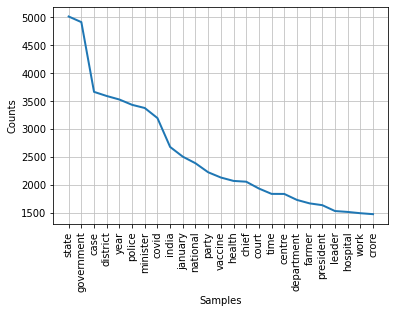

In [ ]:
import nltk
from nltk.corpus import webtext
from nltk.probability import FreqDist


data_analysis = nltk.FreqDist(text_list)
  
  # Let's take the specific words only if their frequency is greater than 3.
filter_words = dict([(m, n) for m, n in data_analysis.items() if len(m) > 3])
  
  #for key in sorted(filter_words):
  #    print("%s: %s" % (key, filter_words[key]))
  
data_analysis = nltk.FreqDist(filter_words)
data_analysis.plot(25, cumulative=False)

##Removal of words less than 3 letters long

In [ ]:
for j in range(len(df)):
  add_list = []
  for i in df['Text'].values[j]:
    if len(i)>3:
      add_list.append(i)
  df['Text'].values[j] = add_list

In [ ]:
text_list = []
for j in range(len(df)):
  for i in df['Text'].values[j]:
    text_list.append(i)
len(text_list)

776334

##Lemmatiztion

In [ ]:
from nltk.stem import WordNetLemmatizer  
lemmatizer = WordNetLemmatizer()

for m in range(len(df)):
  temp1 = []
  temp2 = df['Text'].values[m]
  for i in temp2:
    temp1.append(lemmatizer.lemmatize(i))
  df['Text'].values[m] = temp1 
df.head(len(df))

,Text
0,"[decisive, glorious, land, king, chala, cape, ..."
1,"[born, queen, south, india, style, rewarding, ..."
2,"[indigo, server, hacked, december, internal, d..."
3,"[sony, launch, playstation, india, february, o..."
4,"[apple, remove, game, apps, china, store, meet..."
...,...
204,"[enterprise, win, crore, highway, project, nha..."
205,"[petrol, diesel, price, hiked, scale, high, mu..."
206,"[rupee, gain, paisa, finish, us_dollar, interb..."
207,"[rupee, slip, paisa, us_dollar, early, trade, ..."


##Bigram Formation

In [ ]:
from gensim.models import Phrases
from gensim.models.phrases import Phraser

#Appending all text lists into a single list-of-lists
sentence_stream = []
for i in range(len(df)):
  sentence_stream.append(df['Text'].values[i])

#Creating a bigram model
bigram = Phrases(sentence_stream, min_count=2, threshold=5, delimiter=b' ')

#Training the model
bigram_phraser = Phraser(bigram)

#Applying the model in each corpus
tokens= []
for x in sentence_stream:
  tokens.append(bigram_phraser[x])

In [ ]:
for i in range(10):
  print(tokens[i])

['decisive glorious', 'land king', 'chala', 'cape', 'work', 'decisive glorious', 'land king', 'chala', 'cape', 'worked', 'horse exercised', 'friday', 'january', 'fashion', 'star', 'sovereign power', 'easy', 'romantic', 'baskar', 'empress', 'andromeda', 'finished', 'tifosi', 'maintains form', 'silverman', 'ayaz khan', 'hadar', 'alam', 'moved better', 'finished', 'merrywin', 'cape', 'murugan', 'impressed', 'naomi', 'azad', 'alam', 'green', 'channel', 'kingoftheworld', 'murugan', 'fully', 'eased', 'glorious land', 'alam', 'fine nick', 'king chala', 'azfar syeed', 'moved', 'amendment', 'annexed', 'iltaf hussain', 'moved freely', 'knight envied', 'emelda', 'good shape', 'decisive', 'shahar babu', 'pleased', 'wild passion', 'optimus commander', 'janardhan', 'maidstone kamigallu', 'supreme excelsior', 'battista', 'rajendra singh', 'moved', 'exquisite', 'star', 'prince', 'windsor', 'easily', 'finished length', 'ahead', 'mock', 'race', 'mzilikazi', 'nakhat singh', 'nekhbet', 'rajendra singh', '

In [ ]:
#Updating the Clean Text values in the Data Frame

for i in range(len(df)):
  df['Text'].values[i] = tokens[i]

In [ ]:
df.head(len(df))

,Text
0,"[decisive glorious, land king, chala, cape, wo..."
1,"[born queen, south india, style, rewarding, ex..."
2,"[indigo server, hacked, december, internal doc..."
3,"[sony, launch, playstation india, february, or..."
4,"[apple, remove, game apps, china store, meet, ..."
...,...
204,"[enterprise, win, crore, highway project, nhai..."
205,"[petrol diesel, price hiked, scale, high, mumb..."
206,"[rupee, gain, paisa, finish, us_dollar, interb..."
207,"[rupee slip, paisa, us_dollar, early trade, tr..."


##Train-Test Split

In [ ]:
import sklearn
train, test = sklearn.model_selection.train_test_split(df['Text'], test_size=0.10, random_state=42 )

In [ ]:
print("Train Feature set:\t"+str(len(train)))
print("Train Feature set:\t"+str(len(test)))

Train Feature set:	4300
Train Feature set:	478


In [ ]:
data_lemmatized=train.tolist()
data_lemmatized

[['special drive',
  'hyderabad',
  'narsapur road',
  'plastic free',
  'forest',
  'collecting',
  'waste',
  'narsapur road',
  'medak district',
  'sunday',
  'order',
  'hyderabad',
  'narsapur road',
  'plastic free',
  'special drive',
  'organised',
  'narsapur',
  'urban',
  'forest area',
  'sunday',
  'tonne',
  'plastic',
  'material',
  'collected',
  'forest',
  'ucthis',
  'plastic free',
  'zone',
  'request',
  'visitor',
  'bring',
  'plastic',
  'harmful',
  'environment',
  'fine imposed',
  'break rule',
  'sangareddy district',
  'forest officer',
  'venkateswarlu',
  'added',
  'plastic',
  'harm',
  'animal forest',
  'collected',
  'plastic waste',
  'industrial',
  'waste',
  'chicken',
  'waste',
  'roadside',
  'mambapur',
  'narsapur',
  'help',
  'tractor',
  'forest range',
  'officer',
  'veerendra',
  'babu',
  'forest',
  'section officer',
  'gummadidala',
  'srinivas',
  'local',
  'elected representative',
  'mumbapur',
  'took'],
 ['master movie',


##Finding the Optimal Number of Topics for the LDA Model

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, 
                                                num_topics=num_topics, 
                                                id2word=dictionary,
                                                alpha = 0.5, 
                                            eta = 1.6, 
                                            passes=10, 
                                            random_state=42, 
                                            chunksize = 1600)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
#Creating dictionary
id2word = corpora.Dictionary(data_lemmatized)
#Create Corpus
texts = data_lemmatized
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatized, 
                                                        start=2, 
                                                        limit=50, 
                                                        step=1)

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.2784
Num Topics = 3  has Coherence Value of 0.3219
Num Topics = 4  has Coherence Value of 0.3492
Num Topics = 5  has Coherence Value of 0.4193
Num Topics = 6  has Coherence Value of 0.4901
Num Topics = 7  has Coherence Value of 0.5797
Num Topics = 8  has Coherence Value of 0.4855
Num Topics = 9  has Coherence Value of 0.501
Num Topics = 10  has Coherence Value of 0.4654
Num Topics = 11  has Coherence Value of 0.5481
Num Topics = 12  has Coherence Value of 0.5057
Num Topics = 13  has Coherence Value of 0.5033
Num Topics = 14  has Coherence Value of 0.5087
Num Topics = 15  has Coherence Value of 0.629
Num Topics = 16  has Coherence Value of 0.485
Num Topics = 17  has Coherence Value of 0.5999
Num Topics = 18  has Coherence Value of 0.5744
Num Topics = 19  has Coherence Value of 0.5622
Num Topics = 20  has Coherence Value of 0.5646
Num Topics = 21  has Coherence Value of 0.6141
Num Topics = 22  has Coherence Value of 0.5054
Num Topics = 23  has Coh

##Hyperparameter Tuning

In [ ]:
# Defining  a function to compute the coherence value based on the different values of hyperparamenters
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data, dictionary=dictionary, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [ ]:
import numpy as np
import tqdm
grid = {}
grid['Validation_Set'] = {}
# Topics range
min_topics = 2
max_topics = 11
step_size = 1
topics_range = range(min_topics, max_topics, step_size)
# Alpha parameter
alpha = list(np.arange(0.01, 1, 0.3))
alpha.append('symmetric')
alpha.append('asymmetric')
# Beta parameter
beta = list(np.arange(0.01, 1, 0.3))
beta.append('symmetric')
# Validation sets
num_of_docs = len(corpus)
corpus_sets = [# gensim.utils.ClippedCorpus(corpus, num_of_docs*0.25), 
               # gensim.utils.ClippedCorpus(corpus, num_of_docs*0.5), 
               gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]
corpus_title = ['75% Corpus', '100% Corpus']
model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }
# Can take a long time to run
if 1 == 1:
    pbar = tqdm.tqdm(total=540)
    
    # iterate through validation corpuses
    for i in range(len(corpus_sets)):
        # iterate through number of topics
        for k in topics_range:
            # iterate through alpha values
            for a in alpha:
                # iterare through beta values
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=dictionary, k=k, a=a, b=b)
                                                
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)
                    
                    pbar.update(1)
    
    pbar.close()

In [ ]:
# Creating a Dataframe from the dictionary formed
evaluation_df = pd.DataFrame.from_dict(model_results)
print(evaluation_df)

In [ ]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(evaluation_df["Topics"], evaluation_df["Coherence"])
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.show()

##Building the LDA Model

In [ ]:
# Build LDA model
from gensim.models import CoherenceModel
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)
# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
lda_model = gensim.models.LdaMulticore(corpus=corpus, 
                                            num_topics=37, 
                                            id2word=id2word,
                                            alpha = 0.5, 
                                            eta = 1.6, 
                                            passes=10, 
                                            workers=2, 
                                            random_state=10, 
                                            chunksize = 1600,
                                            per_word_topics = True
                                            )
#pprint(lda_model.print_topics())
#doc_lda = lda_model[corpus]
# Viewing the topics formed
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.000*"antenna" + 0.000*"swapnil" + 0.000*"moth antenna" + 0.000*"live moth" + 0.000*"drone" + 0.000*"antenna sensitive" + 0.000*"found moth" + 0.000*"reacted quickly" + 0.000*"artificial sensor" + 0.000*"odour plume"
Topic: 1 
Words: 0.000*"film" + 0.000*"sankranti" + 0.000*"israeli" + 0.000*"palestinian" + 0.000*"netanyahu" + 0.000*"maili" + 0.000*"sabari" + 0.000*"muradnagar" + 0.000*"air" + 0.000*"excise duty"
Topic: 2 
Words: 0.000*"bird" + 0.000*"specie" + 0.000*"madrid" + 0.000*"rajendran" + 0.000*"game" + 0.000*"apartment" + 0.000*"south africa" + 0.000*"liverpool" + 0.000*"sood" + 0.000*"year"
Topic: 3 
Words: 0.000*"dry ice" + 0.000*"roshan" + 0.000*"east bengal" + 0.000*"stamp" + 0.000*"fighter" + 0.000*"packed dry" + 0.000*"philately park" + 0.000*"vellore" + 0.000*"carbon dioxide" + 0.000*"joint session"
Topic: 4 
Words: 0.000*"minimum temperature" + 0.000*"degree celsius" + 0.000*"song" + 0.000*"yamuna" + 0.000*"musician" + 0.000*"cold wave" + 0.000*"raag

In [ ]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -10.30260344524851

Coherence Score:  0.44326321109583827


##Visualization using Word Clouds and Inter Topic Distance Map

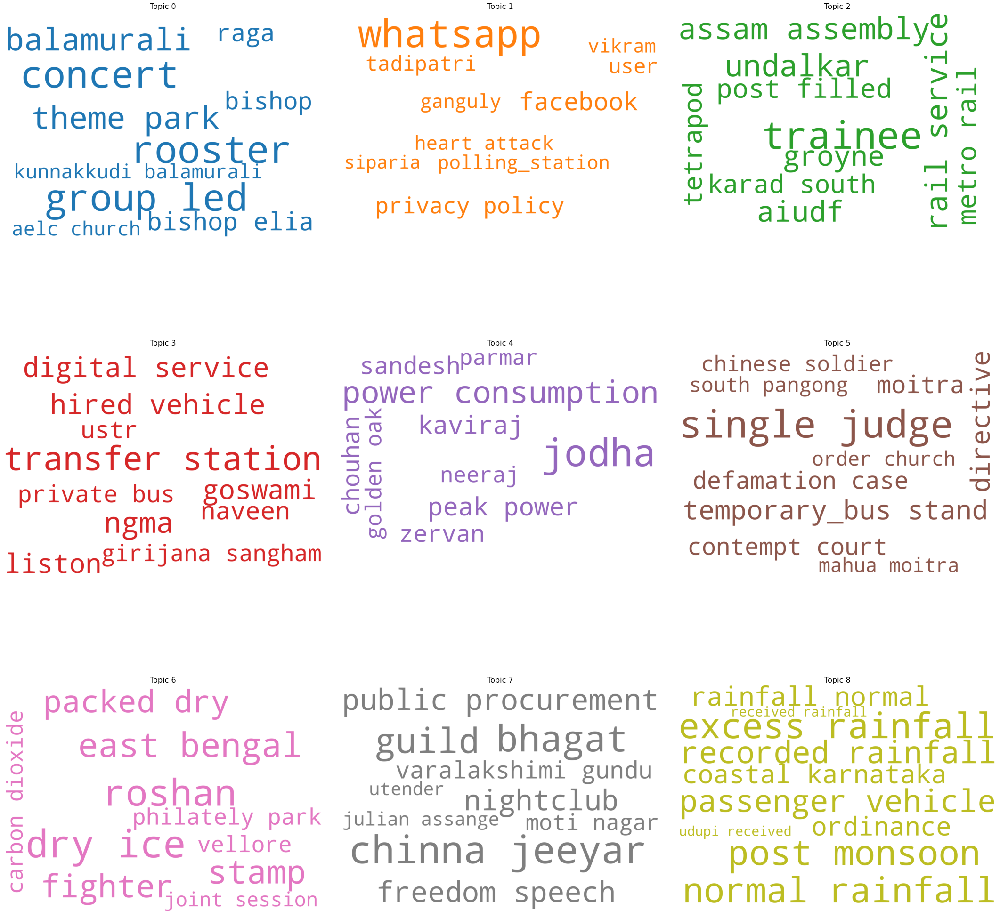

In [ ]:
#Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

# Assigning different colors to each word cloud
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  

# Drawing the word cloud 
Word_cloud = WordCloud(stopwords=STOPWORDS,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=30,
                  colormap='tab10',
                  contour_color='steelblue',
                  color_func=lambda *args, **kwargs: cols[i])

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(3, 3, figsize=(30,30), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    Word_cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(Word_cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=30, hspace=30)
plt.axis('off')
plt.margins(x=20, y=20)
plt.tight_layout()
plt.show()

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6      0.204683  0.001000       1        1  75.494890
16     0.006349 -0.023812       2        1   2.914619
2      0.001038  0.008341       3        1   1.493206
21    -0.005002  0.004175       4        1   1.420697
1     -0.002448  0.006768       5        1   1.374109
14    -0.005553  0.002440       6        1   0.981326
26    -0.006697  0.001860       7        1   0.869497
8     -0.004023 -0.002251       8        1   0.825743
29    -0.006412  0.001678       9        1   0.723189
4     -0.006481  0.000969      10        1   0.721198
18    -0.006495  0.000976      11        1   0.674452
33    -0.005779  0.001051      12        1   0.614804
17    -0.006637  0.000426      13        1   0.611556
7     -0.005913  0.000692      14        1   0.598365
15    -0.006638  0.000383      15        1   0.592167
36    -0.006113  0.000621      16        1   0.573765
13    -0.006611 -0.000069      17        1   0.508137
5     -0.006478  0.000087      18        1   0.506734
32    -0.006399  0.000074      19        1   0.480065
28    -0.006570 -0.000189      20        1   0.475394
20    -0.006702  0.000008      21        1   0.474973
25    -0.006750 -0.000113      22        1   0.473344
22    -0.006425 -0.000224      23        1   0.466020
10    -0.006638 -0.000245      24        1   0.464768
31    -0.006689 -0.000251      25        1   0.463070
11    -0.006590 -0.000052      26        1   0.461071
3     -0.006588 -0.000273      27        1   0.451577
9     -0.006475 -0.000187      28        1   0.451423
30    -0.006637 -0.000319      29        1   0.450991
35    -0.006693 -0.000339      30        1   0.439965
19    -0.006517 -0.000496      31        1   0.438444
27    -0.006585 -0.000318      32        1   0.435019
34    -0.006554 -0.000425      33        1   0.426258
0     -0.006585 -0.000407      34        1   0.420407
23    -0.006340 -0.000382      35        1   0.417301
24    -0.006526 -0.000602      36        1   0.411935
12    -0.006525 -0.000593      37        1   0.399516, topic_info=              Term         Freq        Total Category  logprob  loglift
383       district  1119.000000  1119.000000  Default  30.0000  30.0000
540           case  1142.000000  1142.000000  Default  29.0000  29.0000
623          state  2133.000000  2133.000000  Default  28.0000  28.0000
362       reported   201.000000   201.000000  Default  27.0000  27.0000
815          covid   571.000000   571.000000  Default  26.0000  26.0000
...            ...          ...          ...      ...      ...      ...
55749        bunda     0.034428     3.396261  Topic37 -11.1431   0.9311
55753     itemsthe     0.034428     3.396261  Topic37 -11.1431   0.9311
28283  bypass road     0.058022     7.399666  Topic37 -10.6211   0.6743
5845      fountain     0.052766     9.361891  Topic37 -10.7161   0.3441
20961         bund     0.053326    10.824184  Topic37 -10.7055   0.2096

[1561 rows x 6 columns], token_table=       Topic      Freq              Term
term                                    
68643      1  0.279948            aartis
1881       1  0.570468          abducted
48963      1  0.453569  abetment suicide
70300      1  0.297763            abheri
65227      1  0.301775           abraham
...      ...       ...               ...
3723       1  0.198378            zervan
3723       4  0.198378            zervan
26205      1  0.222507               zoo
26205      2  0.556268               zoo
26205      3  0.111254               zoo

[1947 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 17, 3, 22, 2, 15, 27, 9, 30, 5, 19, 34, 18, 8, 16, 37, 14, 6, 33, 29, 21, 26, 23, 11, 32, 12, 4, 10, 31, 36, 20, 28, 35, 1, 24, 25, 13])

In [ ]:
test_list=test.to_list()

In [ ]:
dist_list = []
count=0
for i in test_list:
  count+=1
  text = i
  dist_list.append(lda_model[id2word.doc2bow(text)])
  print("Document# ", count)
  print(lda_model[id2word.doc2bow(text)])
  print()

Document#  1
([(6, 0.8187492)], [(72, [6]), (158, [6]), (309, [6]), (367, [6]), (429, [6]), (454, [6]), (607, [6]), (637, [6]), (1029, [6]), (1044, [6]), (1140, [6]), (1192, [6]), (1300, [6]), (1371, [6]), (1449, [6]), (1533, [6]), (1638, [6]), (1703, [6, 21]), (1715, [6]), (1784, [6]), (1857, [6]), (1906, [6]), (2015, [6]), (2054, [6]), (2197, [6]), (2364, [6]), (2374, [6]), (2375, [6]), (2385, [6]), (2450, [6]), (2536, [6]), (2903, [6]), (3155, [6]), (3224, [6]), (3248, [6]), (3250, [6]), (4530, [6]), (4536, [6]), (4649, [6]), (4843, [6]), (4871, [6]), (5812, [6]), (6360, [6]), (6459, [6]), (6651, [6]), (6937, [6]), (7352, [6]), (7546, [6]), (7555, [6]), (7558, [6]), (8243, [6]), (8600, [6]), (9262, [6]), (10043, [6]), (11146, [6]), (11672, [6]), (11902, [6]), (11926, [6]), (11930, [6]), (11931, [6, 1, 36, 32, 33, 30, 22, 12, 24, 19, 0, 23, 34, 35, 10, 31, 27, 9, 3, 29, 28, 20, 11, 13, 25, 5, 15, 21, 17, 26, 7, 4, 18, 8, 14, 2, 16]), (11932, [6, 1, 36, 32, 33, 30, 22, 12, 24, 19, 0, 

In [ ]:
test_list[477]

['utf',
 'announces',
 'mlc',
 'candidate',
 'implementation',
 'health',
 'scheme',
 'aided school',
 'teacher',
 'sought',
 'member',
 'andhra pradesh',
 'united',
 'teacher federation',
 'utf',
 'sunday',
 'unanimously decided',
 'field',
 'federation',
 'state president',
 'shaik',
 'sabjee',
 'candidate',
 'east west',
 'godavari district',
 'mlc',
 'boddu',
 'nageswara rao',
 'krishna guntur',
 'teacher',
 'constituency',
 'ensuing election',
 'legislative council',
 'meeting held',
 'vijayawada',
 'federation',
 'state',
 'general secretary',
 'babu',
 'reddy',
 'proposed',
 'mlc',
 'seat',
 'babu',
 'reddy',
 'time',
 'teacher',
 'employee',
 'trampled',
 'need',
 'raise voice',
 'candidate',
 'forefront',
 'agitation',
 'staged',
 'cause',
 'fraternity',
 'leader',
 'requested',
 'finance department',
 'address issue',
 'pertaining',
 'provident fund',
 'municipal',
 'teacher',
 'sought',
 'implementation',
 'health',
 'scheme',
 'teacher',
 'working',
 'aided school',
 'meeti

In [ ]:
df = pd.DataFrame(zip(train, dist_list),
               columns =['Tokenized_Text', 'Topic Distribution'])
df.head(20)

,Tokenized_Text,Topic Distribution
0,"[special drive, hyderabad, narsapur road, plas...","([(6, 0.8187241)], [(72, [6]), (158, [6]), (30..."
1,"[master movie, review, takeaway, vijay, latest...","([(6, 0.878074), (21, 0.0144759305)], [(0, [6]..."
2,"[dvac arrest, inspector head, constable, direc...","([(6, 0.8766044)], [(260, [6]), (309, [6]), (3..."
3,"[jaishemohammad, overground, worker, held, pol...","([(6, 0.88371146)], [(30, [6]), (159, [6]), (1..."
4,"[machinery, deployed, extract, load sand, norm...","([(4, 0.40620196), (6, 0.28363237)], [(182, [4..."
5,"[diwakar, urge, elderly resident, amaravati, j...","([(6, 0.7110302)], [(159, [6]), (231, [6]), (2..."
6,"[lillard, roll, trail blazer, minnesota timber...","([(6, 0.8684175)], [(8, [6]), (44, [6]), (176,..."
7,"[alagiri, slam, government, seating cinema, al...","([(6, 0.83562976)], [(0, [6]), (29, [6]), (38,..."
8,"[representation, defer, nursery admission, cou...","([(6, 0.8194631)], [(41, [6]), (204, [6]), (23..."
9,"[panel, look, ladakh, issue, member delegation...","([(6, 0.89769274)], [(22, [6]), (72, [6]), (78..."
